In [3]:
import numpy as np
import pandas as pd
import scanpy as sc
import os
import sys
import anndata
import scvi

import matplotlib.pyplot as plt
import matplotlib as mpl

In [4]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = '../results/images/integrated/SoC_maternalFoetal/'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=200)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
absl                NA
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiw

'/opt/conda/bin/python'

In [3]:
def identityTransfer(adata_CellsNewID, adata, field='identity'):
    
    '''
    Function to transfer the value in a .obs column, modifying only the cells included in adata_CellsNewID
    
    Parameters:
        adata_CellsNewID: anndata object with cells. These should have in their .obs[field] the new values to be transfer to adata
        adata: anndata object to modify. The value in .obs[field] will be modifies for all the cells in adata_CellsNewID
        field: column name in .obs to operate in
        
    '''
    
    #converting categorical into strings to introduce new categories
    adata.obs[field]=adata.obs[field].astype("string")


    #assigning the new categories to the cells in adata
    for cell in adata_CellsNewID.obs.index:
        adata.obs[field][cell] = adata_CellsNewID.obs[field][cell]

    #Returning strings into categorical 
    adata.obs[field]=adata.obs[field].astype("category")
    
    return(adata)

In [4]:
#Function to add the souporcell id

def add_souporcell_id(adata_obj, cell_id):
    '''
    Function to add the souporcell status (e.g. 0,1, not pooled, etc.) to the cells
    
    Input
        adata_obj: adata object
        cell_id: id of a cell
    
    '''
    
    curr_sample = adata_obj.obs.loc[cell_id, 'sample']
    
    #print('sample',sample, 'barcode', cell_id)
    
    if curr_sample in samples:
        #print(curr_sample)
        #extracts the table contained in the indicated key of the dictionary
        curr_souporcell_table = souporcell_clusters[curr_sample]
        
        if (cell_id in list(curr_souporcell_table.index)): #checking that the cells are into the data
            curr_assign = souporcell_clusters[curr_sample].loc[cell_id,'assignment']
            #print('returning',curr_assign)
            return(curr_assign)

        else:
            # cell barcode is filtered by souporcell
            return('filtered_by_souporcell')
    else:
        return('not_available')

In [123]:
adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV2.h5ad')

## Adding SoC Maternal-Foetal annotation to the integrated adata object

In [124]:
samples = list(np.unique(adata.obs['sample']))

In [125]:
#--- Use this chunk in case you need to remove samples without SoC run
#','Pla_HDBR11345027','Pla_HDBR11345028','Pla_HDBR11345029','Pla_HDBR11345033'
for sample in ['Pla_HDBR10917732']:
    samples.remove(sample)
    
    #Pla_HDBR10917732 is a special case and will be loaded separately
    # as it has k=4 (multiplexed samples & maternal-foetal genotype)

In [126]:
samples

['Pla_HDBR10917729',
 'Pla_HDBR10917730',
 'Pla_HDBR10917731',
 'Pla_HDBR10917733',
 'Pla_HDBR10917734',
 'Pla_HDBR11345027',
 'Pla_HDBR11345028',
 'Pla_HDBR11345029',
 'Pla_HDBR11345031',
 'Pla_HDBR11345032',
 'Pla_HDBR11345033']

In [127]:
# reading in souporcell outputs
# sample to cluster
souporcell_clusters = {}


for sample in samples:
    print('sample', sample)
    path = '../data/souporcell/maternal_foetal/'+sample+'/clusters.tsv' #path to the souporcell output
    souporcell_clusters[sample] = pd.read_csv(path, sep='\t') #read souporcell output as pandas DF
    #adding the DF into the dictionary
    souporcell_clusters[sample]['sample_barcode'] = [sample+'_'+j for j in souporcell_clusters[sample]['barcode']]
    souporcell_clusters[sample]['sample_barcode'] = [elem.split('-')[0] for elem in souporcell_clusters[sample]['sample_barcode']]
    souporcell_clusters[sample].set_index('sample_barcode', drop=False, inplace=True)

sample Pla_HDBR10917729
sample Pla_HDBR10917730
sample Pla_HDBR10917731
sample Pla_HDBR10917733
sample Pla_HDBR10917734
sample Pla_HDBR11345027
sample Pla_HDBR11345028
sample Pla_HDBR11345029
sample Pla_HDBR11345031
sample Pla_HDBR11345032
sample Pla_HDBR11345033


In [128]:
#As Pla_HDBR10917732 has k=4, I am loading it separately because it has a -soc4 suffix
sample='Pla_HDBR10917732'

path = '../data/souporcell/maternal_foetal/Pla_HDBR10917732-soc4/clusters.tsv' #path to the souporcell output
souporcell_clusters[sample] = pd.read_csv(path, sep='\t') #read souporcell output as pandas DF
#adind the DF into the dictionary
souporcell_clusters[sample]['sample_barcode'] = [sample+'_'+j for j in souporcell_clusters[sample]['barcode']]
souporcell_clusters[sample]['sample_barcode'] = [elem.split('-')[0] for elem in souporcell_clusters[sample]['sample_barcode']]
souporcell_clusters[sample].set_index('sample_barcode', drop=False, inplace=True)


#adding the ID back into the sample's list
samples=samples+['Pla_HDBR10917732']

In [129]:
#souporcell_clusters.keys()

In [130]:
samples

['Pla_HDBR10917729',
 'Pla_HDBR10917730',
 'Pla_HDBR10917731',
 'Pla_HDBR10917733',
 'Pla_HDBR10917734',
 'Pla_HDBR11345027',
 'Pla_HDBR11345028',
 'Pla_HDBR11345029',
 'Pla_HDBR11345031',
 'Pla_HDBR11345032',
 'Pla_HDBR11345033',
 'Pla_HDBR10917732']

In [131]:
#adata.obs=adata.obs.drop(['souporcell_MFgenotype'], axis=1)

In [132]:
#Adding the SoC pooled status
#%%time

adata.obs['souporcell_MFgenotype'] = adata.obs['sample_barcode'].apply(lambda x: add_souporcell_id(adata,x))

In [1]:
# genotype assigned successfully
#adata.obs['souporcell_MFgenotype']

In [134]:
set(adata.obs['souporcell_MFgenotype'])

{'0',
 '0/1',
 '0/2',
 '0/3',
 '1',
 '1/0',
 '1/2',
 '1/3',
 '2',
 '2/0',
 '2/1',
 '2/3',
 '3',
 '3/0',
 '3/1',
 '3/2',
 'filtered_by_souporcell'}

### Creating a new column to save the Maternal/Fetal identity of the cells

In [135]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
adata.obs['souporcell_MFidentity']= adata.obs['souporcell_MFgenotype']

### NOTE:
Remember that the annotation given by souporcell will vary from sample to sample, therefore, each sample must be analysed
separately

In [136]:
samples

['Pla_HDBR10917729',
 'Pla_HDBR10917730',
 'Pla_HDBR10917731',
 'Pla_HDBR10917733',
 'Pla_HDBR10917734',
 'Pla_HDBR11345027',
 'Pla_HDBR11345028',
 'Pla_HDBR11345029',
 'Pla_HDBR11345031',
 'Pla_HDBR11345032',
 'Pla_HDBR11345033',
 'Pla_HDBR10917732']

In [2]:
#adata.obs.head()

### Sample Pla_HDBR10917729

In [138]:
#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR10917729']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


/opt/conda/lib/python3.8/site-packages/anndata/_core/anndata.py:1207: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'souporcell_MFgenotype' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'souporcell_MFidentity' as categorical


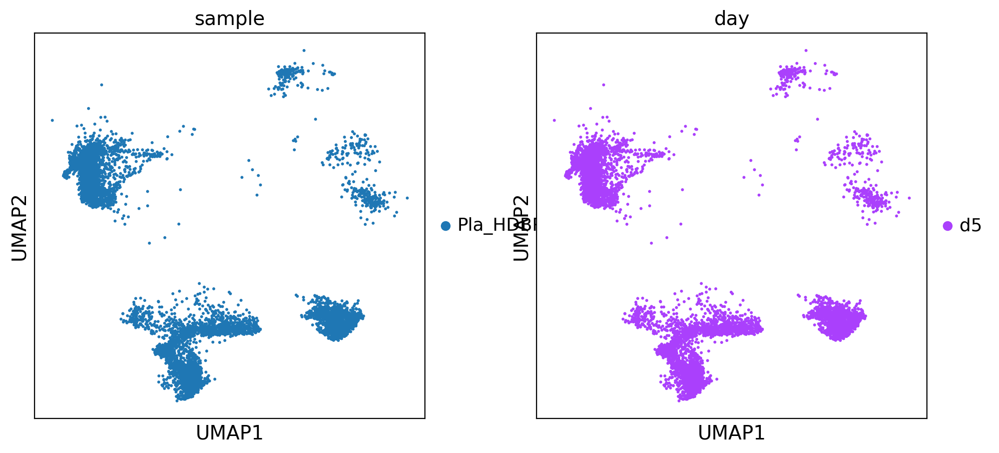

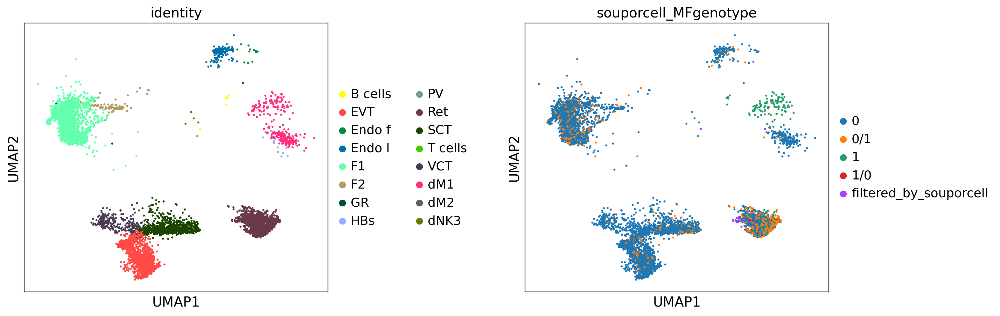

In [139]:
#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

In [ ]:
#clustering
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

**Considering the plots, 0 corresponds to foetal cells and 1 to maternal**

In [141]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Fetal", "1": "Maternal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

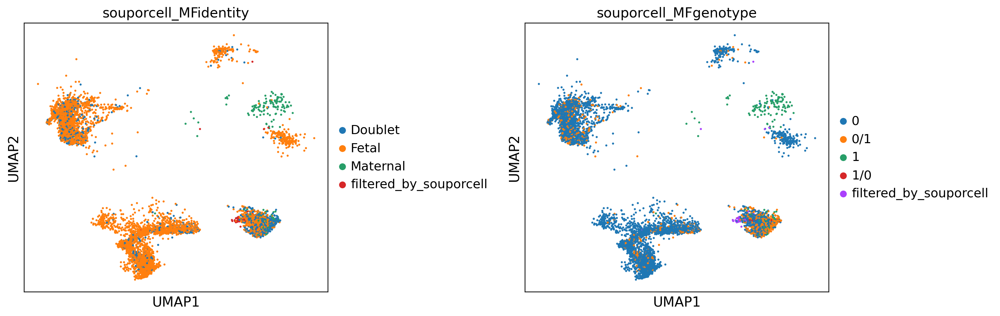

In [142]:
#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)

In [143]:
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

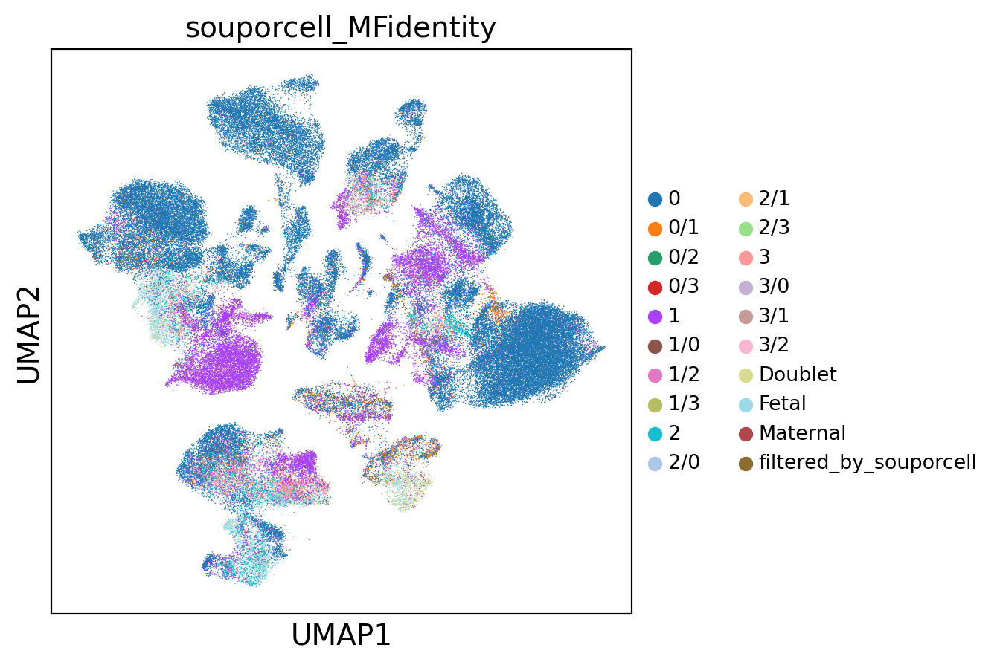

In [144]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')

### Sample Pla_HDBR10917730

In [ ]:
#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR10917730']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)


In [ ]:
#clustering all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

In [ ]:

#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Maternal", "1": "Fetal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))


#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)



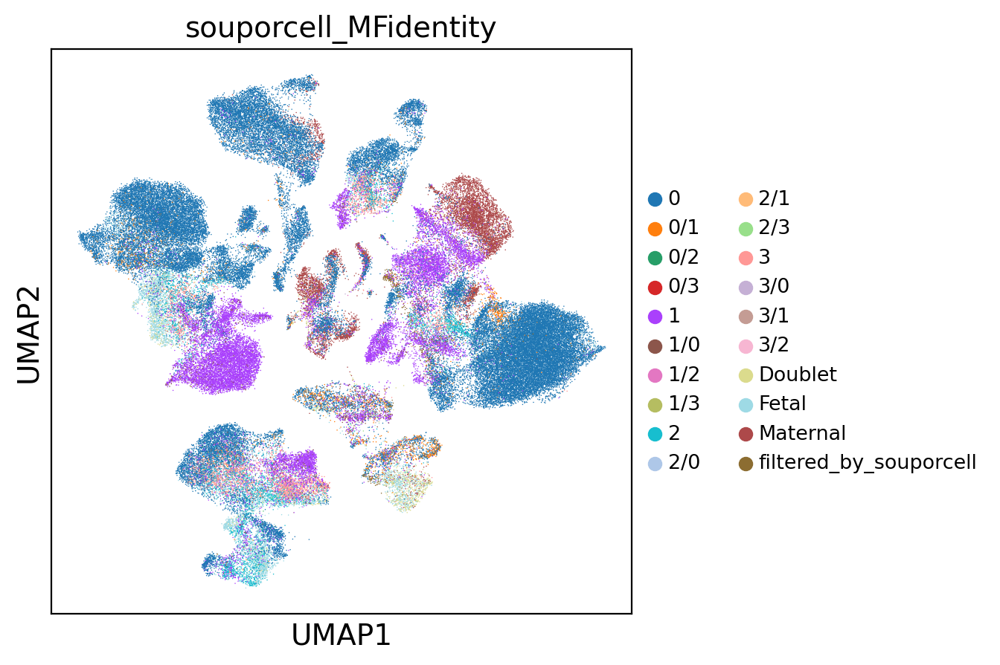

In [148]:
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')



In [149]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV3.h5ad')

### Sample Pla_HDBR10917731

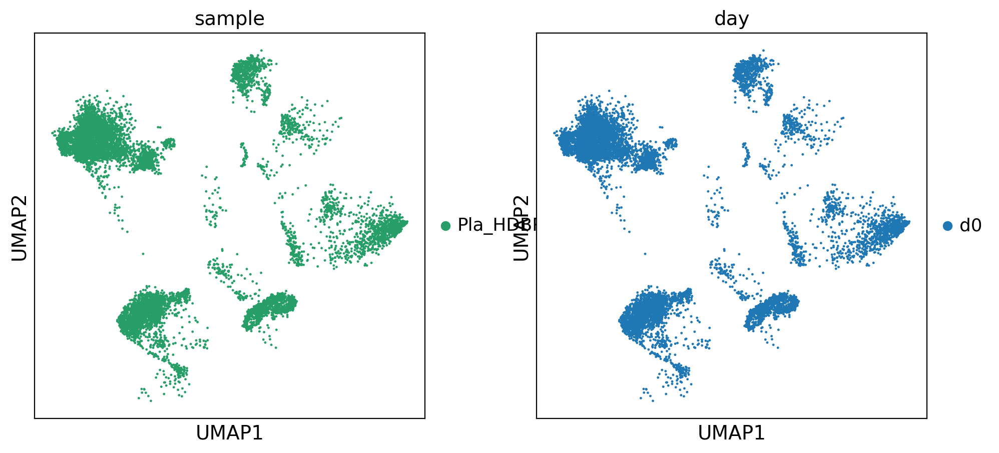

Trying to set attribute `.uns` of view, copying.


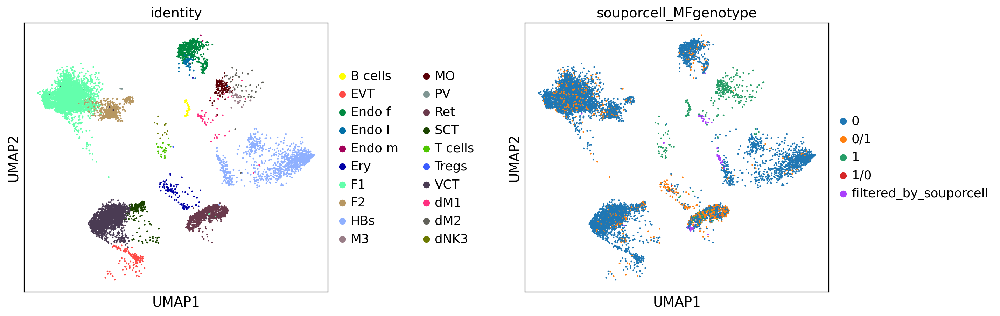

In [150]:
#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR10917731']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)


In [ ]:
#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)


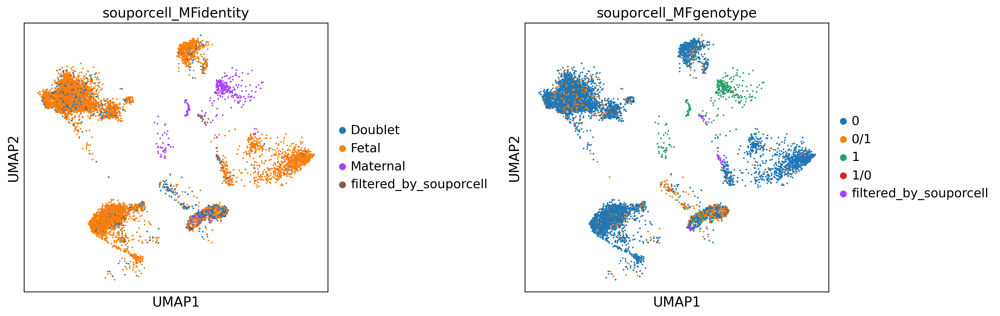

In [152]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Fetal", "1": "Maternal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))


#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)


In [ ]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')


### Sample Pla_HDBR10917733

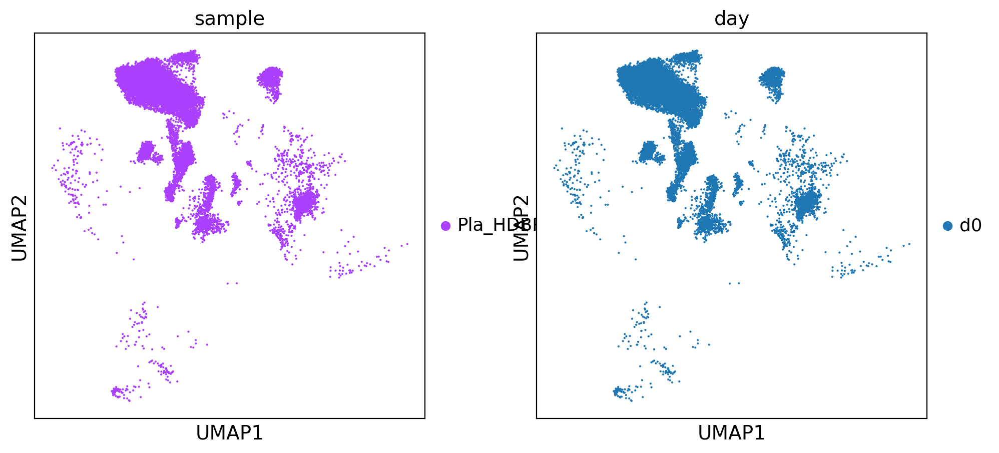

Trying to set attribute `.uns` of view, copying.


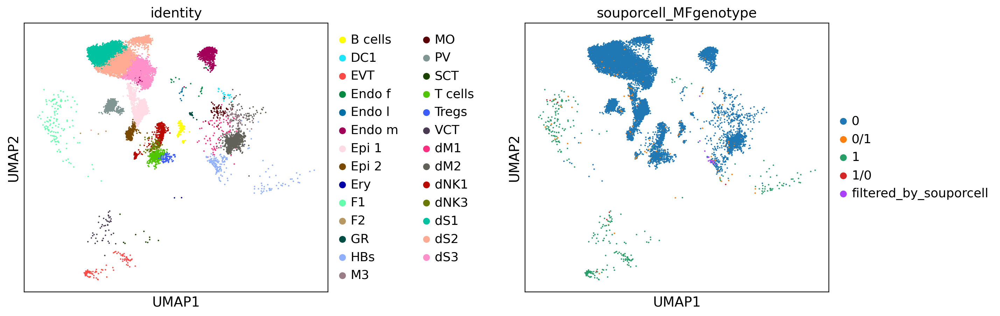

In [154]:
#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR10917733']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

In [ ]:
#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

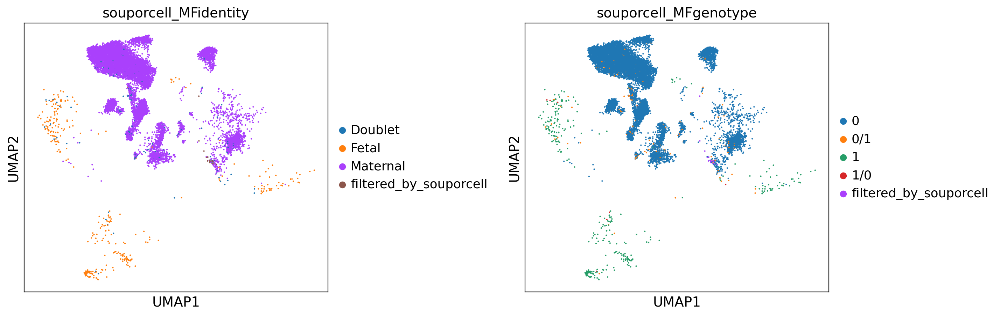

In [156]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Maternal", "1": "Fetal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)


In [ ]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')


### Sample Pla_HDBR10917734

In [ ]:
#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR10917734']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

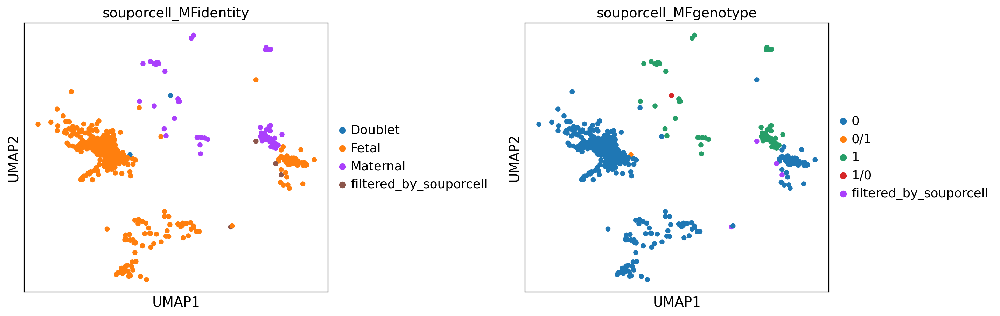

In [159]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Fetal", "1": "Maternal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)


In [ ]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')



### Sample Pla_HDBR11345031

In [ ]:
#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR11345031']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

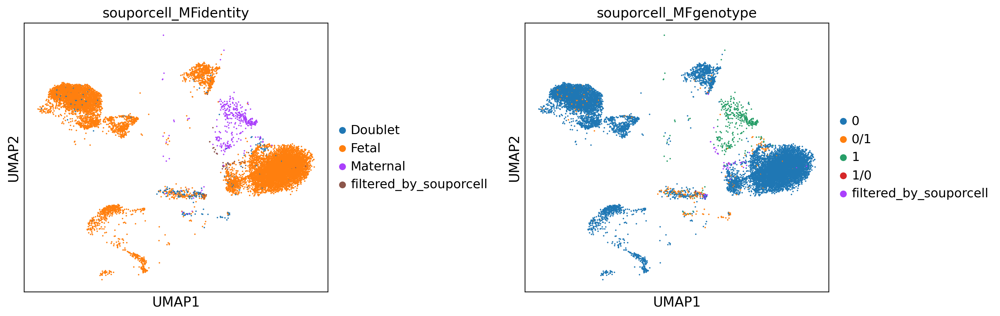

In [162]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Fetal", "1": "Maternal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)



In [ ]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')


### Sample Pla_HDBR11345032

In [ ]:

#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR11345032']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

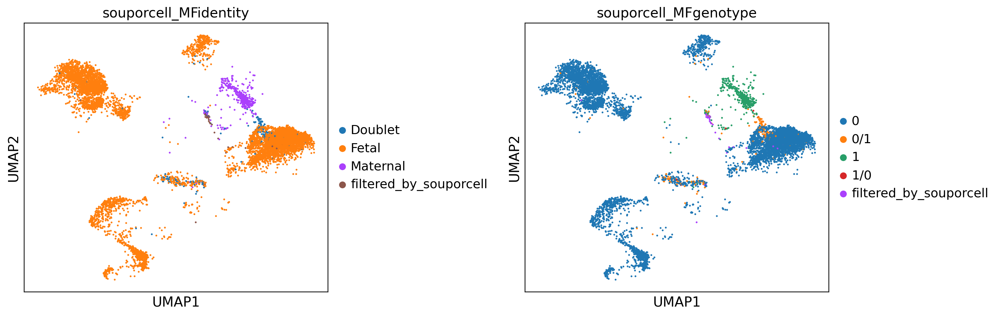

In [165]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Fetal", "1": "Maternal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)

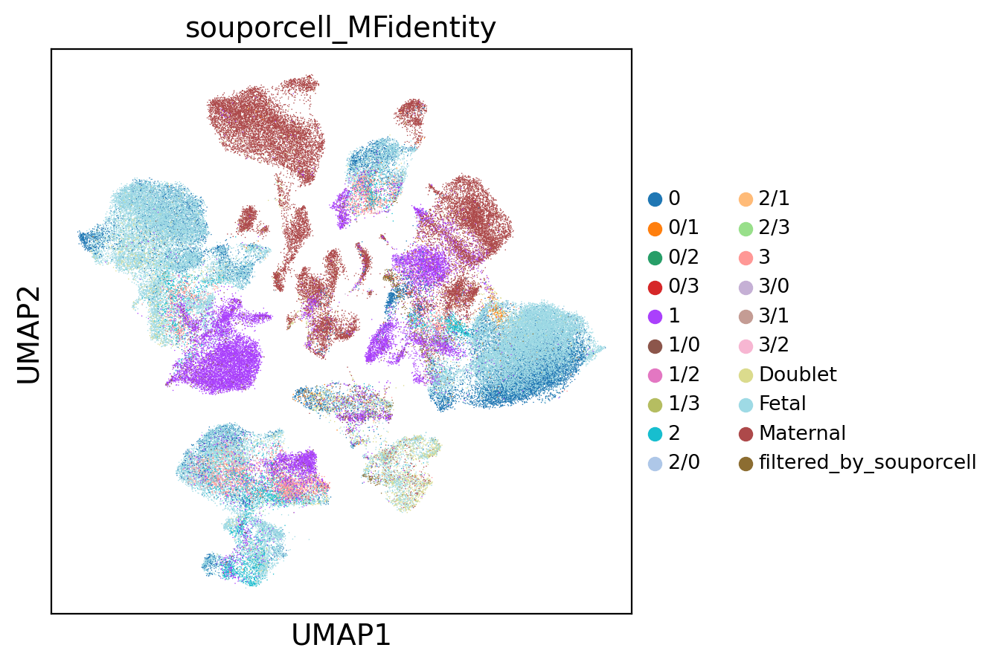

In [166]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')


In [167]:
#adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV3.h5ad')

### Sample Pla_HDBR11345027

In [ ]:

#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR11345027']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

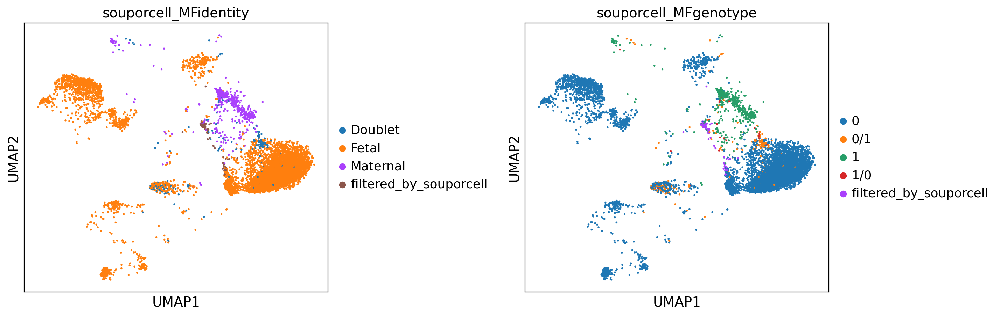

In [169]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Fetal", "1": "Maternal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)

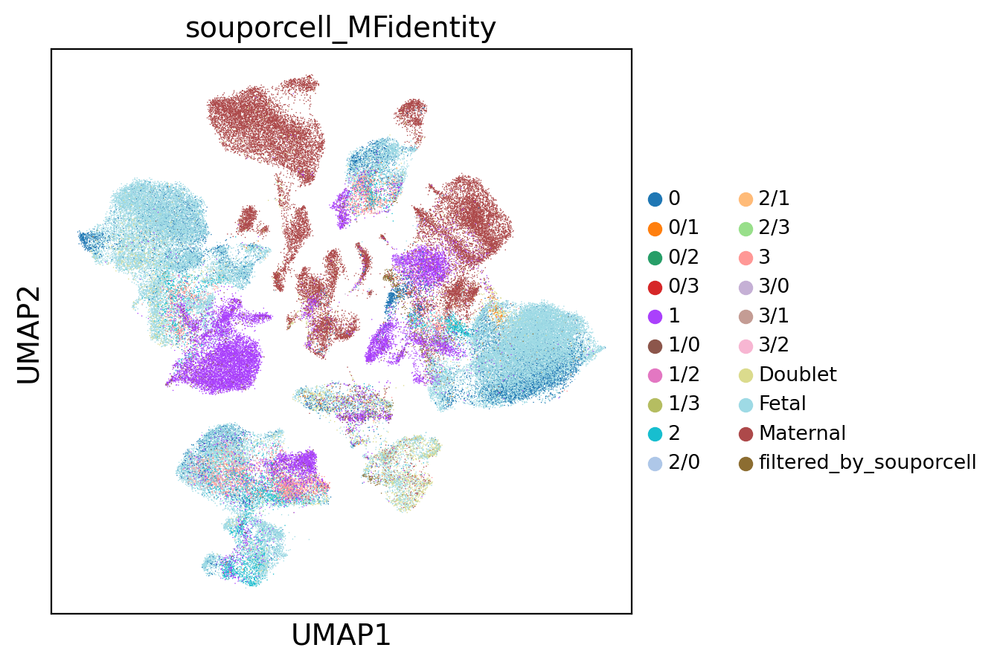

In [170]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')

### Sample Pla_HDBR11345028

In [ ]:

#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR11345028']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

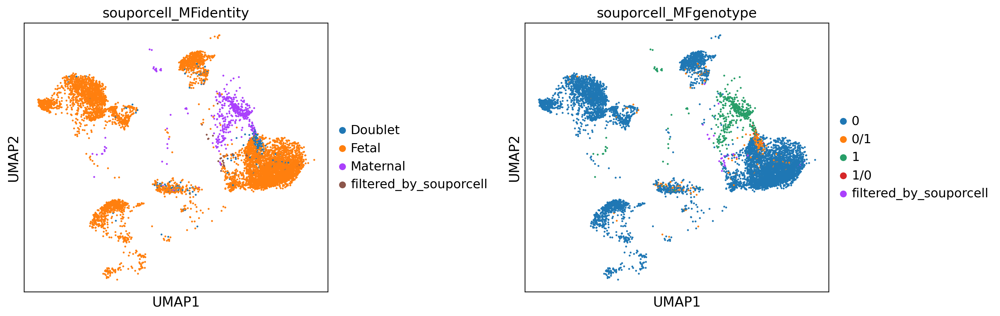

In [172]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Fetal", "1": "Maternal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)

In [ ]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')

### Sample Pla_HDBR11345029

In [ ]:

#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR11345029']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

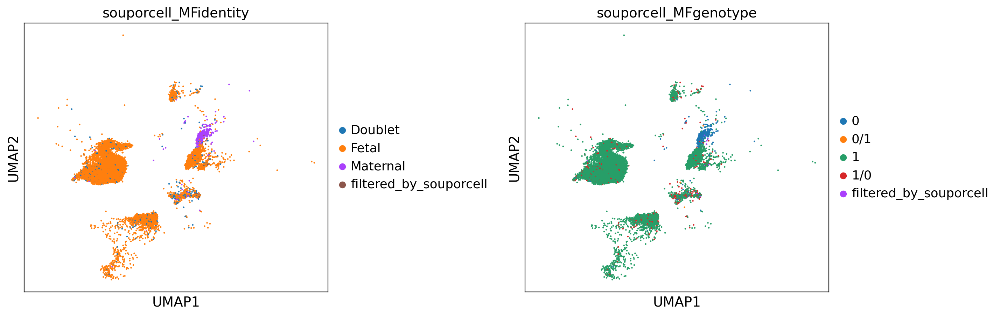

In [175]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Maternal", "1": "Fetal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)

In [ ]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')

### Sample Pla_HDBR11345033

In [ ]:

#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR11345033']

#clustering
sc.pl.umap(sample, color=["sample",'day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)

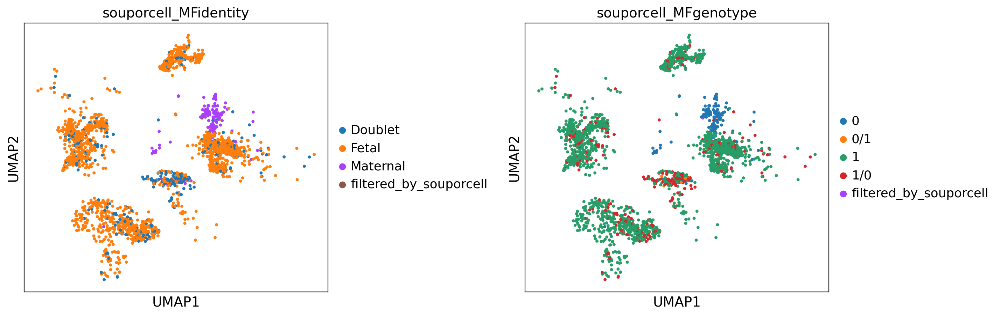

In [178]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Maternal", "1": "Fetal", "0/1": "Doublet", "1/0": "Doublet"}
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)

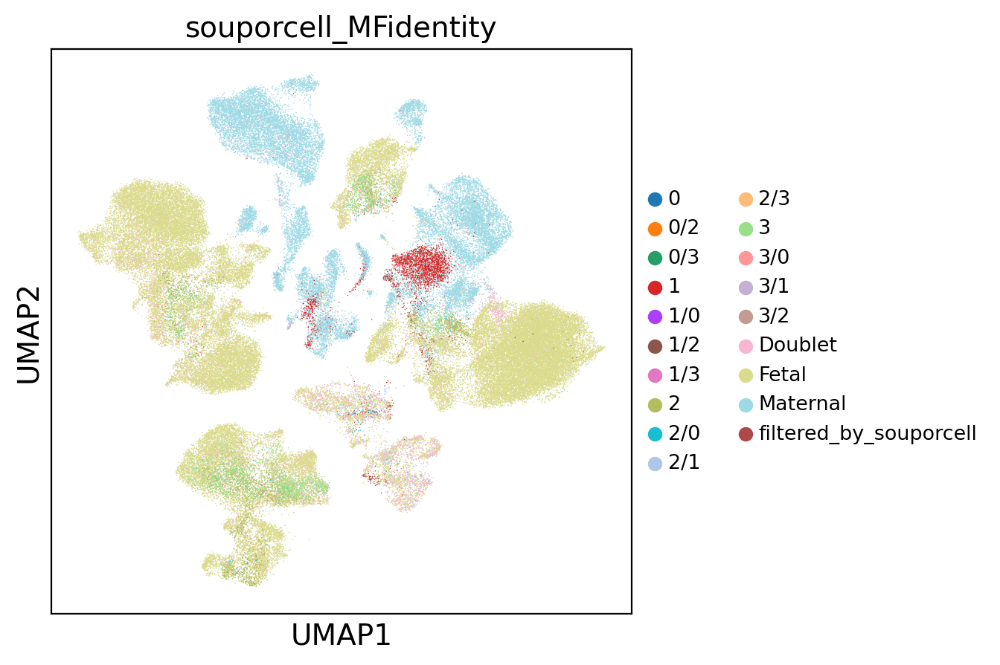

In [179]:
#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')

In [180]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV3.h5ad')

In [181]:
#'Pla_HDBR11345028','Pla_HDBR11345029','Pla_HDBR11345033'

In [182]:
#deleting the temp variable sample with the cell subset
del(sample)

In [183]:
#adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV3.h5ad')

### Sample Pla_HDBR10917732 is a special case as it has k=4 (multiplexed samples & maternal-foetal genotype)

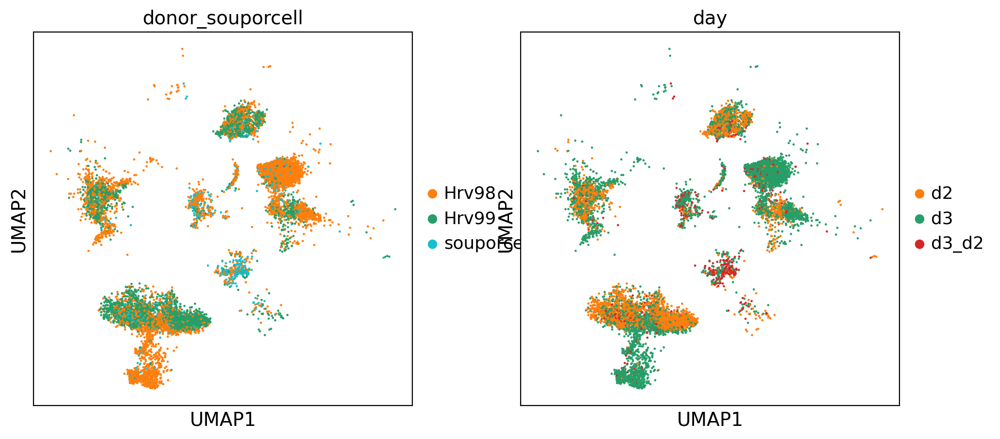

Trying to set attribute `.uns` of view, copying.


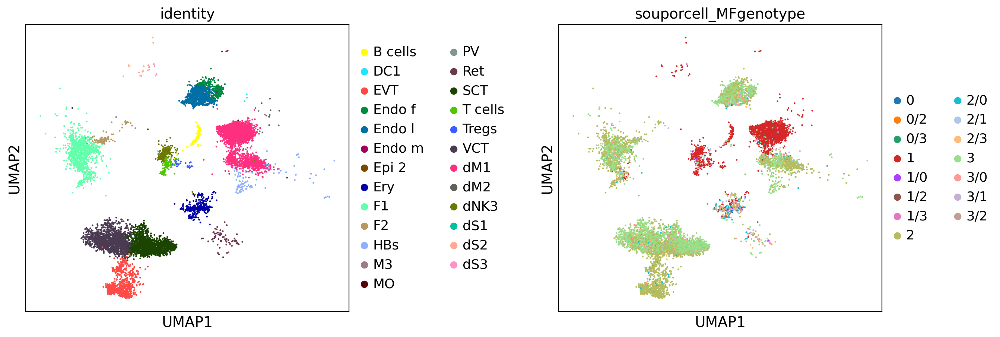

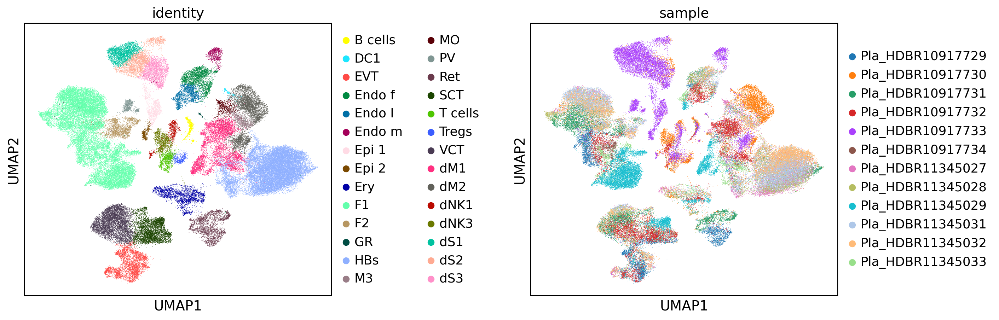

In [184]:
#Selecting the sample
sample = adata[adata.obs['sample'] == 'Pla_HDBR10917732']

#clustering
sc.pl.umap(sample, color=['donor_souporcell','day'])
#clustering
sc.pl.umap(sample, color=['identity',"souporcell_MFgenotype"], wspace=0.5)

#clustering of all data
sc.pl.umap(adata, color=['identity',"sample"], wspace=0.5)


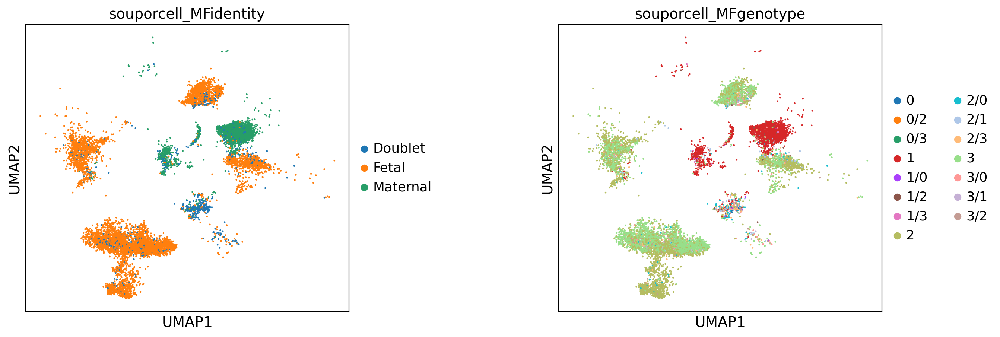

In [185]:
#Function that changes the souporcell_MFgenotype names for the indicated MF indentities
sample.obs['souporcell_MFidentity'] = (sample.obs["souporcell_MFgenotype"].map(lambda x: 
                            {"0": "Doublet","0/2": "Doublet","0/3": "Doublet",
                             "1": "Maternal", "1/0": "Doublet", "1/2": "Doublet",  "1/3": "Doublet",
                             "2": "Fetal", "2/0": "Doublet", "2/1": "Doublet", "2/3": "Doublet",
                             "3": "Fetal", "3/0": "Doublet", "3/1": "Doublet", "3/2": "Doublet",
                            }
                            .get(x, x)).astype("category"))

#clustering
sc.pl.umap(sample, color=["souporcell_MFidentity",'souporcell_MFgenotype'], wspace=0.5)



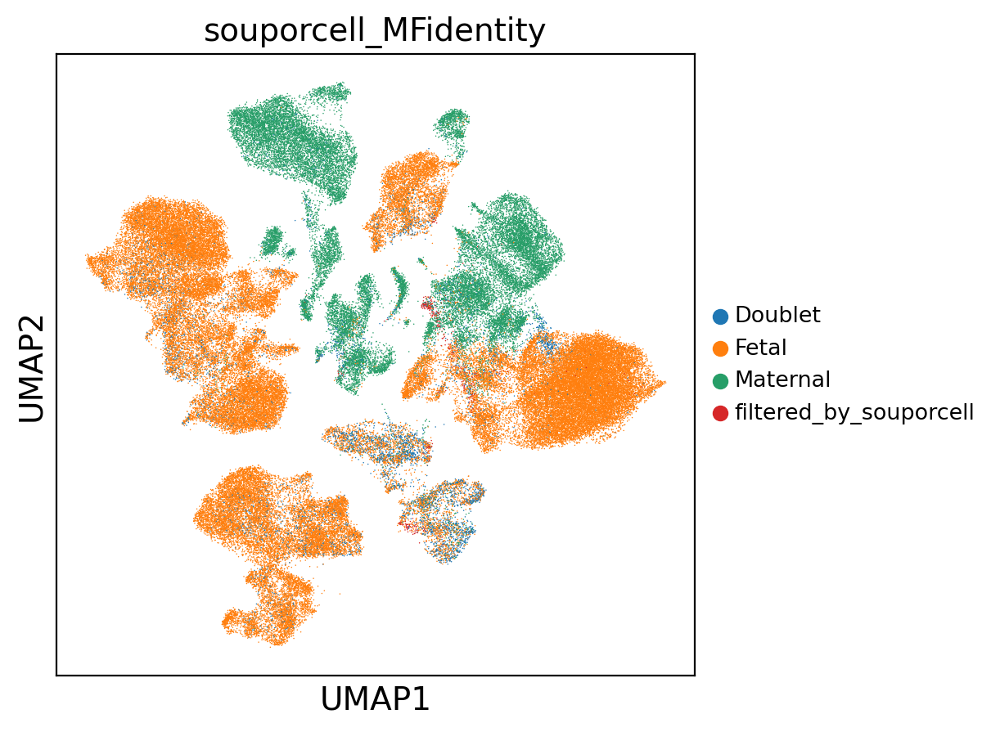

In [186]:

#Transfering the identity to the column in the original object
adata= identityTransfer(sample, adata, field= 'souporcell_MFidentity')

# use scVI imputed values for plottin
sc.pl.umap(adata, color=['souporcell_MFidentity' ], legend_fontsize='x-small')


In [187]:
#Cleaning the cells filtered by SoC
adata = adata[adata.obs['souporcell_MFidentity'] != 'filtered_by_souporcell']

In [76]:
mpl.rcParams['figure.figsize'] = 5,5

In [261]:
mpl.rcParams["axes.prop_cycle"]

'#1f77b4'
'#ff7f0e'
'#279e68'
'#d62728'
'#aa40fc'
'#8c564b'
'#e377c2'
'#b5bd61'
'#17becf'
'#aec7e8'
'#ffbb78'


Trying to set attribute `.uns` of view, copying.


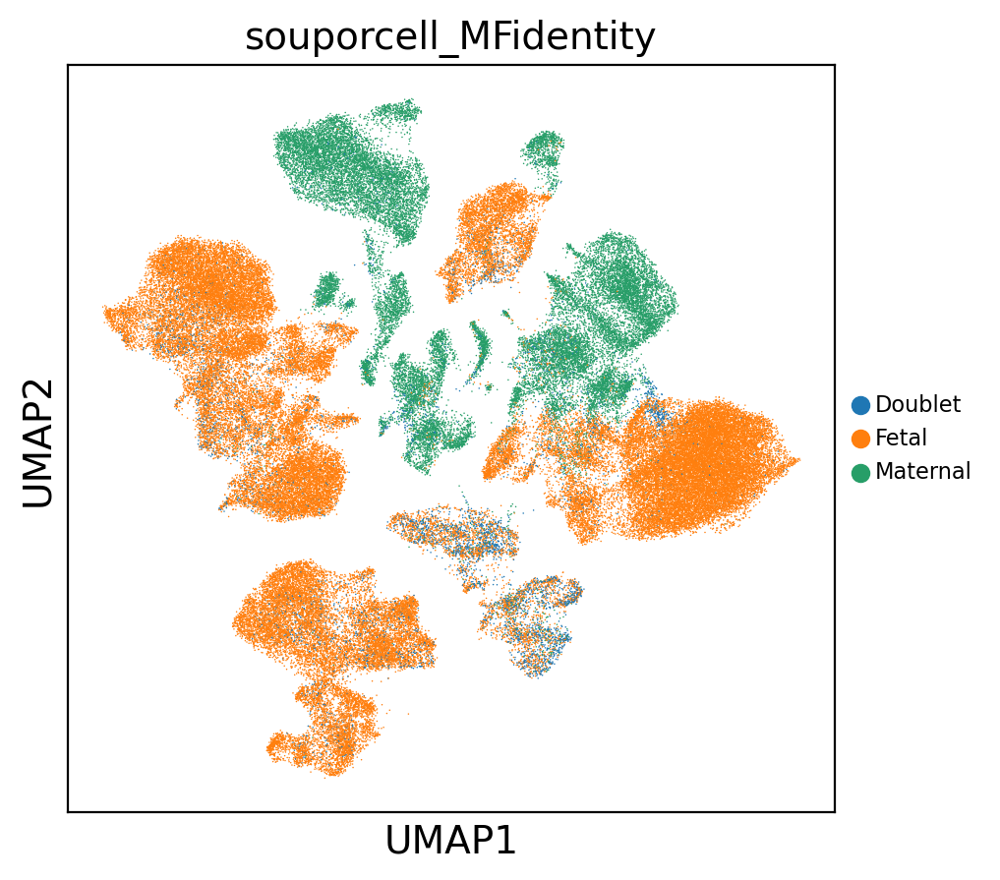

In [188]:
sc.pl.umap(adata, color=['souporcell_MFidentity' ],legend_fontsize='xx-small',wspace=0.3,
           save='_scVI_latent30_cleanV3_MFidentity.pdf')

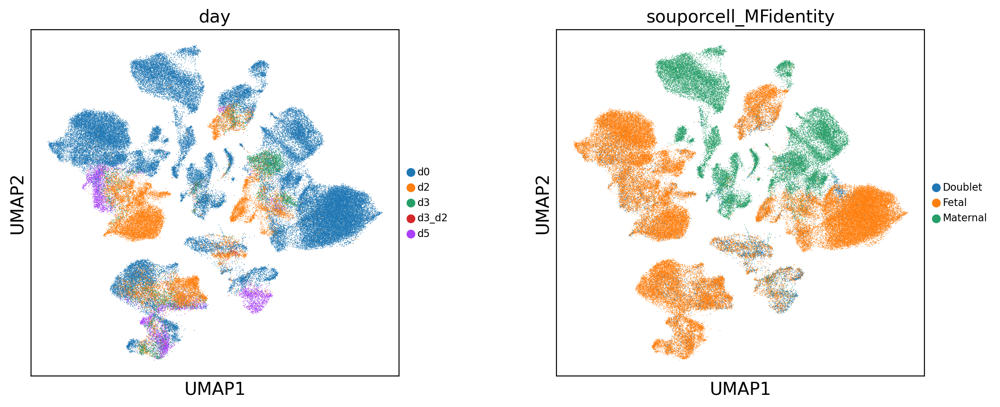

In [189]:
sc.pl.umap(adata, color=['day', 'souporcell_MFidentity'],legend_fontsize='xx-small',wspace=0.3)

In [190]:
adata.write('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV3.h5ad')

In [220]:
#adata= sc.read('../results/scVI/S2_scVIintegrated_adata_latent30_cleanV3.h5ad')